# Normalization

**Import**

In [1]:
# from second tutorial notebook (Part02)
import scanpy as sc
import pandas as pd
import scvelo as scv
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
import ipywidgets as widgets

# others
import re
import os

# first tutorial
import bbknn
import diffxpy.api as dxpy
import plotly.express as px

In [3]:
path_out = f'/home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/data/mapping/BON/adata/'

adata_out_mm = f'{path_out}/preproc_1_starsolo_multimap_bon.h5ad'

In [4]:
palette_dict = {"Elongated_spermatids":'#0173B2',"Round_spermatids":'#FF7C00',"Spermatocytes":"green","Spermatogonia":"red"}

In [5]:
# open saved data
adata = sc.read(adata_out_mm)

In [6]:
adata

AnnData object with n_obs × n_vars = 7407 × 25509
    obs: 'DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets'
    var: 'gene_ids', 'feature_types', 'chromosome', 'n_cells'
    layers: 'raw_counts', 'spliced', 'unspliced'

In [7]:
pwd

'/faststorage/project/testis_singlecell/Workspaces/adahl/birc-project-akd/notebooks/norm_cluster'

In [8]:
cd '/home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/tutorial/'

/faststorage/project/testis_singlecell/Workspaces/adahl/birc-project-akd/tutorial


In [9]:
%run Scripts/pythonScripts.py

computing PCA
    with n_comps=50
    finished (0:00:08)


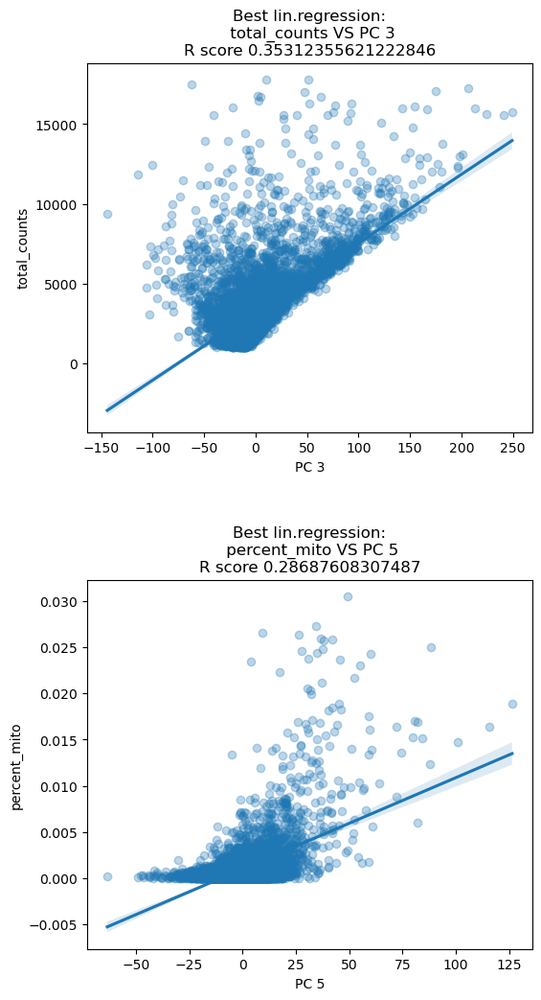

In [20]:
#from /home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/tutorial/Scripts/pythonScripts import dependentFeatures

#PCA on unnormalized data
sc.preprocessing.pca(adata, svd_solver='arpack', random_state=12345)
#Calculating correlations
dependentFeatures(adata=adata, obs_subset=['total_counts','percent_mito']) # plots the PC with the highest R2 to total counts and percent mito, respectively


computing PCA
    with n_comps=50
    finished (0:00:08)


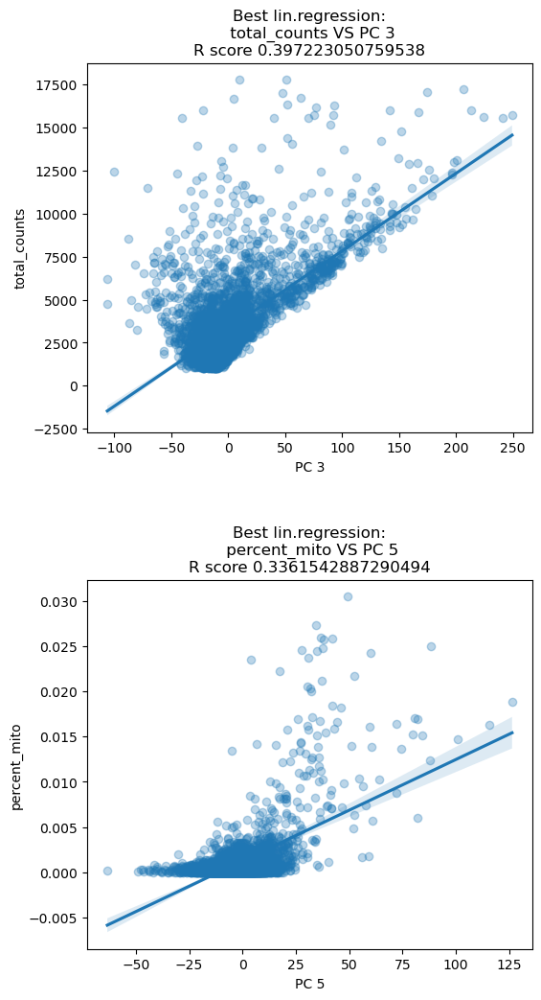

In [11]:
# one batch
sc.preprocessing.pca(adata, svd_solver='arpack', random_state=12345)
dependentFeatures(adata=adata[adata.obs['DATASET'] == 'SN224'], #sample name
                  obs_subset=['total_counts','percent_mito']) #technical features

The third biggest variation in the data at this point is explained by total UMI count. Normalizing with TPM should remove this bias.

In [12]:
adata

AnnData object with n_obs × n_vars = 7407 × 25509
    obs: 'DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets'
    var: 'gene_ids', 'feature_types', 'chromosome', 'n_cells'
    uns: 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'raw_counts', 'spliced', 'unspliced'

In [13]:
adata.var_names

Index(['LOC100996442', 'LOC729737', 'LOC112268260', 'LOC100132287',
       'LOC105378947', 'OR4F16', 'LOC100288069', 'LINC01409', 'LINC00115',
       'LINC01128',
       ...
       'ND2', 'COX1', 'COX2', 'ATP6', 'COX3', 'ND3', 'ND4L', 'ND4', 'ND5',
       'CYTB'],
      dtype='object', length=25509)

In [14]:
rawMatrix = adata.X.todense().T
cells = adata.obs_names
genes = adata.var_names
dataset = np.array(adata.obs["DATASET"])

In [15]:
rawMatrix.shape

(25509, 7407)

In [ ]:
adata.obs.head()

,DATASET,batch,total_counts,n_genes_by_counts,percent_mito,prop_unspl,prop_spl,perc_MALAT1,n_genes,doublet_scores,predicted_doublets
SN219_AAACCTGAGAAAGTGG,SN219,0,1714.0,1542,0.000583,0.662829,0.337171,0.030922,1542,0.009507,False
SN219_AAACCTGAGACCTTTG,SN219,0,2619.0,2171,0.000382,0.490518,0.509482,0.104238,2171,0.013530,False
SN219_AAACCTGAGATCCCAT,SN219,0,5871.0,3047,0.000852,0.204245,0.795755,0.003577,3047,0.022767,False
SN219_AAACCTGAGCGGCTTC,SN219,0,4542.5,3138,0.000440,0.261074,0.738926,0.003082,3138,0.052783,False
SN219_AAACCTGAGGCGCTCT,SN219,0,1253.5,1216,0.000000,0.583141,0.416859,0.033506,1216,0.010446,False


In [13]:
adata.obs.tail()

,DATASET,batch,total_counts,n_genes_by_counts,percent_mito,prop_unspl,prop_spl,perc_MALAT1,n_genes,doublet_scores,predicted_doublets
SN224_TTTGTCACATCCTTGC,SN224,1,4607.000000,3107,0.00114,0.532145,0.467855,0.071630,3107,0.009507,False
SN224_TTTGTCAGTCTAGAGG,SN224,1,3270.999756,2577,0.00000,0.386909,0.613091,0.005809,2577,0.015841,False
SN224_TTTGTCAGTGAGTGAC,SN224,1,4063.499756,2759,0.00000,0.248306,0.751694,0.002707,2759,0.020735,False
SN224_TTTGTCATCCGCAGTG,SN224,1,3413.499756,2837,0.00000,0.630099,0.369901,0.030760,2837,0.132041,False
SN224_TTTGTCATCGGAATCT,SN224,1,3788.000000,2415,0.00000,0.292619,0.707381,0.114044,2415,0.090532,False


In [14]:
adata.layers

Layers with keys: raw_counts, spliced, unspliced

In [15]:
adata.to_df(layer="raw_counts")

,LOC100996442,LOC729737,LOC107985721,LOC112268260,LOC100132287,LOC105378947,OR4F16,LOC100288069,LINC01409,LINC00115,...,COX1,COX2,ATP6,COX3,ND3,ND4L,ND4,ND5,ND6,CYTB
SN219_AAACCTGAGAAAGTGG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,...,0.0,0.00,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SN219_AAACCTGAGACCTTTG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SN219_AAACCTGAGATCCCAT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.00,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SN219_AAACCTGAGCGGCTTC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.00,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
SN219_AAACCTGAGGCGCTCT,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SN224_TTTGTCACATCCTTGC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.25,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
SN224_TTTGTCAGTCTAGAGG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SN224_TTTGTCAGTGAGTGAC,0.0,0.0,0.0,0.0,0.0,0.0,0.5,1.0,0.0,0.0,...,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SN224_TTTGTCATCCGCAGTG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [16]:
# TPM normalization. 
sc.pp.normalize_per_cell(adata)

In [17]:
adata.to_df()

,LOC100996442,LOC729737,LOC107985721,LOC112268260,LOC100132287,LOC105378947,OR4F16,LOC100288069,LINC01409,LINC00115,...,COX1,COX2,ATP6,COX3,ND3,ND4L,ND4,ND5,ND6,CYTB
SN219_AAACCTGAGAAAGTGG,0.00000,0.0,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,0.887086,...,0.000000,0.00000,1.774171,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
SN219_AAACCTGAGACCTTTG,0.00000,0.0,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,0.000000,...,1.161054,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
SN219_AAACCTGAGATCCCAT,0.00000,0.0,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,0.000000,...,0.517233,0.00000,1.034467,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
SN219_AAACCTGAGCGGCTTC,0.00000,0.0,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,0.000000,...,0.668466,0.00000,0.000000,0.668466,0.0,0.0,0.0,0.0,0.0,0.0
SN219_AAACCTGAGGCGCTCT,2.43551,0.0,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,0.000000,...,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SN224_TTTGTCACATCCTTGC,0.00000,0.0,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,0.000000,...,0.658920,0.82365,0.000000,0.658920,0.0,0.0,0.0,0.0,0.0,0.0
SN224_TTTGTCAGTCTAGAGG,0.00000,0.0,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,0.000000,...,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
SN224_TTTGTCAGTGAGTGAC,0.00000,0.0,0.0,0.0,0.0,0.0,0.37384,0.747679,0.0,0.000000,...,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
SN224_TTTGTCATCCGCAGTG,0.00000,0.0,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,0.000000,...,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0


In [18]:
# matrix logarithmization (ln(x+1))
sc.pp.log1p(adata)

In [19]:
# to see counts
adata.to_df()

,LOC100996442,LOC729737,LOC107985721,LOC112268260,LOC100132287,LOC105378947,OR4F16,LOC100288069,LINC01409,LINC00115,...,COX1,COX2,ATP6,COX3,ND3,ND4L,ND4,ND5,ND6,CYTB
SN219_AAACCTGAGAAAGTGG,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.635034,...,0.000000,0.00000,1.020352,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
SN219_AAACCTGAGACCTTTG,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,0.770596,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
SN219_AAACCTGAGATCCCAT,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,0.416889,0.00000,0.710234,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
SN219_AAACCTGAGCGGCTTC,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,0.511905,0.00000,0.000000,0.511905,0.0,0.0,0.0,0.0,0.0,0.0
SN219_AAACCTGAGGCGCTCT,1.234165,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SN224_TTTGTCACATCCTTGC,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,0.506167,0.60084,0.000000,0.506167,0.0,0.0,0.0,0.0,0.0,0.0
SN224_TTTGTCAGTCTAGAGG,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
SN224_TTTGTCAGTGAGTGAC,0.000000,0.0,0.0,0.0,0.0,0.0,0.317609,0.558289,0.0,0.000000,...,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
SN224_TTTGTCATCCGCAGTG,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0


In [20]:
# most variable genes, True or False
sc.pp.highly_variable_genes(adata, n_top_genes=15000)

In [21]:
# scale, standardized with mean 0 and variance 1
sc.pp.scale(adata)
adata.layers['scaled_counts'] = adata.X.copy()

In [22]:
adata.to_df()

,LOC100996442,LOC729737,LOC107985721,LOC112268260,LOC100132287,LOC105378947,OR4F16,LOC100288069,LINC01409,LINC00115,...,COX1,COX2,ATP6,COX3,ND3,ND4L,ND4,ND5,ND6,CYTB
SN219_AAACCTGAGAAAGTGG,-0.387236,-0.185652,-0.051085,-0.189555,-0.139278,-0.059738,-0.114976,-0.191396,-0.269495,4.162167,...,-0.666873,-0.357682,2.339107,-0.683225,-0.194152,-0.131751,-0.386473,-0.201154,-0.052926,-0.414169
SN219_AAACCTGAGACCTTTG,-0.387236,-0.185652,-0.051085,-0.189555,-0.139278,-0.059738,-0.114976,-0.191396,-0.269495,-0.263543,...,0.507061,-0.357682,-0.417436,-0.683225,-0.194152,-0.131751,-0.386473,-0.201154,-0.052926,-0.414169
SN219_AAACCTGAGATCCCAT,-0.387236,-0.185652,-0.051085,-0.189555,-0.139278,-0.059738,-0.114976,-0.191396,-0.269495,-0.263543,...,-0.031780,-0.357682,1.501304,-0.683225,-0.194152,-0.131751,-0.386473,-0.201154,-0.052926,-0.414169
SN219_AAACCTGAGCGGCTTC,-0.387236,-0.185652,-0.051085,-0.189555,-0.139278,-0.059738,-0.114976,-0.191396,-0.269495,-0.263543,...,0.112968,-0.357682,-0.417436,0.069926,-0.194152,-0.131751,-0.386473,-0.201154,-0.052926,-0.414169
SN219_AAACCTGAGGCGCTCT,4.690014,-0.185652,-0.051085,-0.189555,-0.139278,-0.059738,-0.114976,-0.191396,-0.269495,-0.263543,...,-0.666873,-0.357682,-0.417436,-0.683225,-0.194152,-0.131751,-0.386473,-0.201154,-0.052926,-0.414169
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SN224_TTTGTCACATCCTTGC,-0.387236,-0.185652,-0.051085,-0.189555,-0.139278,-0.059738,-0.114976,-0.191396,-0.269495,-0.263543,...,0.104227,1.801738,-0.417436,0.061484,-0.194152,-0.131751,-0.386473,-0.201154,-0.052926,-0.414169
SN224_TTTGTCAGTCTAGAGG,-0.387236,-0.185652,-0.051085,-0.189555,-0.139278,-0.059738,-0.114976,-0.191396,-0.269495,-0.263543,...,-0.666873,-0.357682,-0.417436,-0.683225,-0.194152,-0.131751,-0.386473,-0.201154,-0.052926,-0.414169
SN224_TTTGTCAGTGAGTGAC,-0.387236,-0.185652,-0.051085,-0.189555,-0.139278,-0.059738,4.567006,4.657104,-0.269495,-0.263543,...,-0.666873,-0.357682,-0.417436,-0.683225,-0.194152,-0.131751,-0.386473,-0.201154,-0.052926,-0.414169
SN224_TTTGTCATCCGCAGTG,-0.387236,-0.185652,-0.051085,-0.189555,-0.139278,-0.059738,-0.114976,-0.191396,-0.269495,-0.263543,...,-0.666873,-0.357682,-0.417436,-0.683225,-0.194152,-0.131751,-0.386473,-0.201154,-0.052926,-0.414169


In [23]:
adata.var

,gene_ids,feature_types,chromosome,n_cells,highly_variable,means,dispersions,dispersions_norm,mean,std
LOC100996442,LOC100996442,Gene Expression,1,2563,True,0.132876,0.258873,0.394050,0.094128,0.243078
LOC729737,LOC729737,Gene Expression,1,688,False,0.020337,-0.264949,-1.933276,0.015793,0.085067
LOC107985721,LOC107985721,Gene Expression,1,54,False,0.001564,-0.315143,-2.156283,0.001212,0.023720
LOC112268260,LOC112268260,Gene Expression,1,664,False,0.027335,-0.005410,-0.780153,0.020049,0.105767
LOC100132287,LOC100132287,Gene Expression,1,418,False,0.009244,-0.343487,-2.282214,0.007437,0.053393
...,...,...,...,...,...,...,...,...,...,...
ND4L,ND4L,Gene Expression,MT,292,False,0.013683,-0.030918,-0.893481,0.009974,0.075701
ND4,ND4,Gene Expression,MT,2280,True,0.212017,0.959985,2.847046,0.129763,0.335761
ND5,ND5,Gene Expression,MT,647,False,0.038060,0.166519,-0.016277,0.026533,0.131905
ND6,ND6,Gene Expression,MT,50,False,0.002511,0.076747,-0.415129,0.001769,0.033423


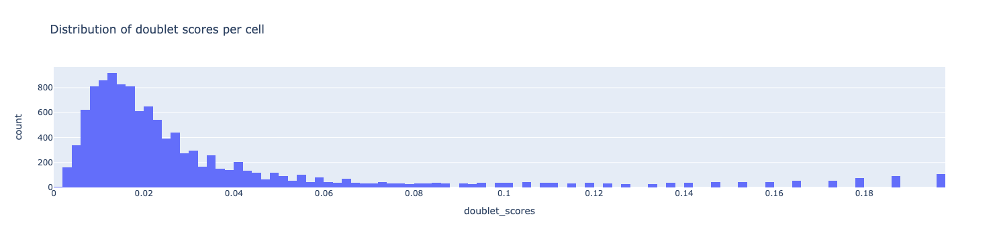

In [24]:
fig = px.histogram(adata.obs, x='doublet_scores', title='Distribution of doublet scores per cell')
fig.show()

In [25]:
adata.layers

Layers with keys: raw_counts, spliced, unspliced, scaled_counts

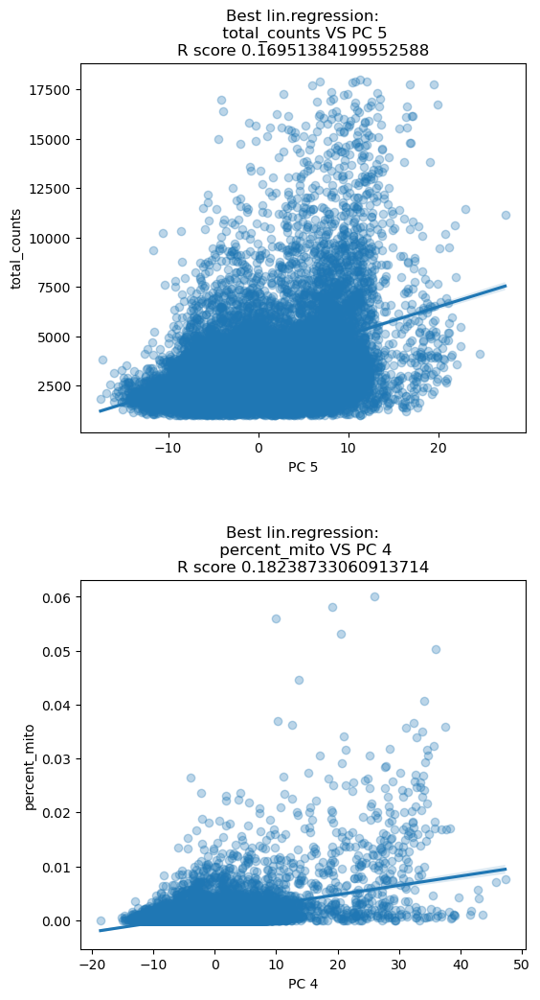

In [26]:
#PCA on normalized data
sc.preprocessing.pca(adata, svd_solver='arpack', random_state=12345)
#Calculating correlations
dependentFeatures(adata=adata, obs_subset=['total_counts','percent_mito'])

Now the correlation isn't strong.

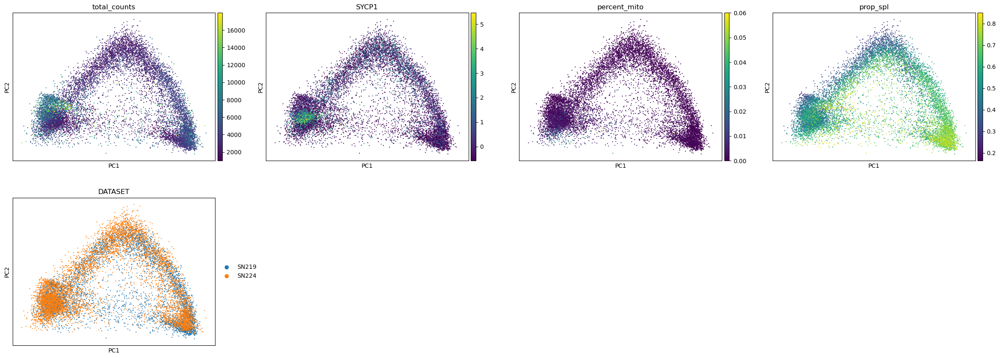

In [27]:
sc.pl.pca(adata, color=['total_counts', 'SYCP1', 'percent_mito', 'prop_spl', 'DATASET'])

Luckily the samples overlap, so they can be analyzed combined

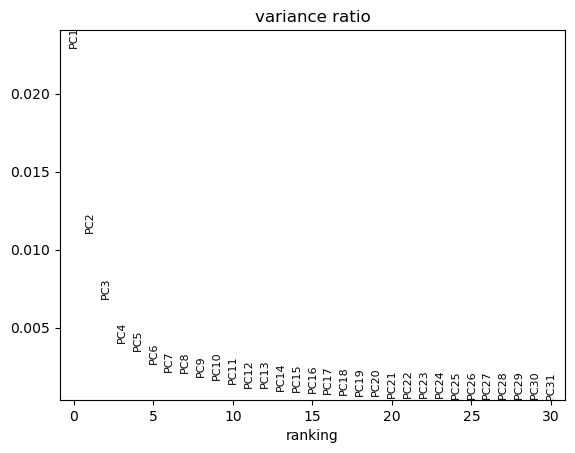

In [28]:
sc.plotting.pca_variance_ratio(adata) # small variance means it probably models noice in the data

Keep the PCs with the most variance, e.g. up to PC15

In [29]:
#sc.pp.neighbors(adata, n_pcs=15, random_state=12345) # use only for data with one single sample
bbknn.bbknn(adata, n_pcs=15)

In [30]:
sc.tools.umap(adata, random_state=54321)

In [31]:
#sc.tools.umap(adata, random_state=54321, n_components=3) # 3 components for 3D projection

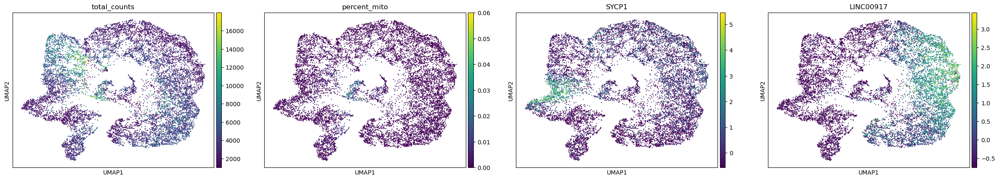

In [32]:
sc.plotting.umap(adata, color=['total_counts','percent_mito', 'SYCP1','LINC00917'])

In [33]:
# sc.plotting.umap(adata, color=['TNP2'], components=['1,2','1,3','2,3']) 

In [34]:
# X = adata.obsm['X_umap']
# fig = px.scatter_3d(adata.obsm, x=X[:,0], y=X[:,1], z=X[:,2], color=adata.obs['total_counts'], opacity=.5)
# fig.show()

In [35]:
# sc.plotting.umap(adata, color=['TNP2'], projection='3d', components=['1,2,3'] 

In [36]:
adata

AnnData object with n_obs × n_vars = 11852 × 27335
    obs: 'DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets', 'n_counts'
    var: 'gene_ids', 'feature_types', 'chromosome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'pca', 'log1p', 'hvg', 'DATASET_colors', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts', 'spliced', 'unspliced', 'scaled_counts'
    obsp: 'distances', 'connectivities'

In [37]:
print( list( adata.obs.columns ) )

['DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets', 'n_counts']


In [38]:
print( list( adata.var.columns ) )

['gene_ids', 'feature_types', 'chromosome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std']


In [39]:
markers = dict() #make an empty dictionary
### SPERMATOCYTOGENESIS
markers['SpermatogoniaA'] = ['ID4','HMGA1']
markers['SpermatogoniaB'] = ['MKI67','DMRT1','STRA8'] 
markers['SpermatocytesI'] = ['MEIOB','PRSS50','SYCP1','TEX101']
markers['SpermatocytesII'] = ['PIWIL1','ACRV1','SPATA16','CLGN']
### SPERMIOGENESIS
markers['Round.Spt'] = ['SPATA9','SPAM1'] #Round spermatids
markers['Elong.Spt'] = ['PRM1','PRM2'] #Elongated spermatids
### SOMATIC CELLS
markers['Sertoli'] = ['CTSL', 'VIM']
markers['Macroph'] = ['CD163','TYROBP']
markers['Leydig'] = ['CFD']
markers['Endothelial'] = ['CD34']
markers['Myoid'] = ['ACTA2']
markers['Pericyte'] = ['MYL9']

In [40]:
markers_scores, adata = marker_score(markers, adata)

In [41]:
adata

AnnData object with n_obs × n_vars = 11852 × 27335
    obs: 'DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets', 'n_counts', 'SpermatogoniaA_score', 'SpermatogoniaB_score', 'SpermatocytesI_score', 'SpermatocytesII_score', 'Round.Spt_score', 'Elong.Spt_score', 'Sertoli_score', 'Macroph_score', 'Leydig_score', 'Endothelial_score', 'Myoid_score', 'Pericyte_score'
    var: 'gene_ids', 'feature_types', 'chromosome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'pca', 'log1p', 'hvg', 'DATASET_colors', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts', 'spliced', 'unspliced', 'scaled_counts'
    obsp: 'distances', 'connectivities'

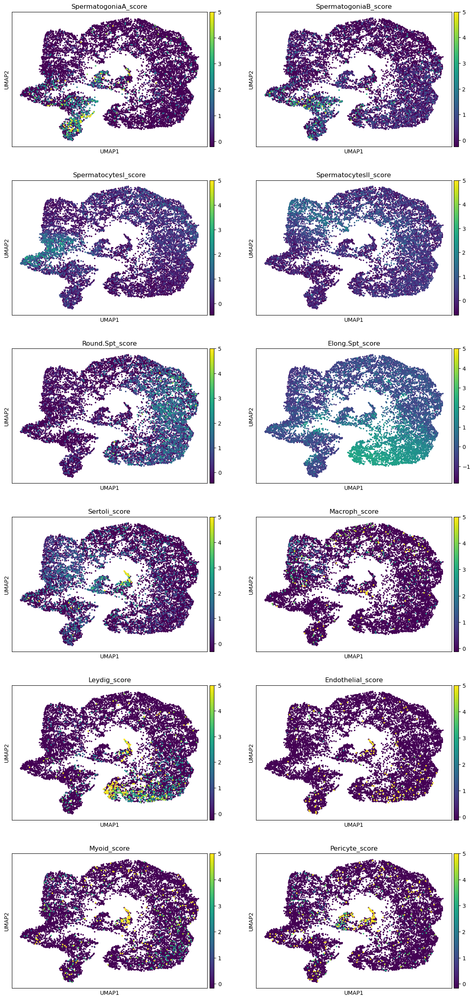

In [42]:
sc.plotting.umap(adata, color=markers_scores, components=['1,2'], ncols=2, vmax=5, s=30)

In [43]:
adata

AnnData object with n_obs × n_vars = 11852 × 27335
    obs: 'DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets', 'n_counts', 'SpermatogoniaA_score', 'SpermatogoniaB_score', 'SpermatocytesI_score', 'SpermatocytesII_score', 'Round.Spt_score', 'Elong.Spt_score', 'Sertoli_score', 'Macroph_score', 'Leydig_score', 'Endothelial_score', 'Myoid_score', 'Pericyte_score'
    var: 'gene_ids', 'feature_types', 'chromosome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'pca', 'log1p', 'hvg', 'DATASET_colors', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts', 'spliced', 'unspliced', 'scaled_counts'
    obsp: 'distances', 'connectivities'

In [44]:
#leiden clustering at various resolutions
sc.tools.leiden(adata, resolution=1, random_state=12345, key_added='leiden_R1')
sc.tools.leiden(adata, resolution=0.5, random_state=12345, key_added='leiden_R.5')
sc.tools.leiden(adata, resolution=0.25, random_state=12345, key_added='leiden_R.25')
sc.tools.leiden(adata, resolution=0.1, random_state=12345, key_added='leiden_R.1')

In [45]:
adata

AnnData object with n_obs × n_vars = 11852 × 27335
    obs: 'DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets', 'n_counts', 'SpermatogoniaA_score', 'SpermatogoniaB_score', 'SpermatocytesI_score', 'SpermatocytesII_score', 'Round.Spt_score', 'Elong.Spt_score', 'Sertoli_score', 'Macroph_score', 'Leydig_score', 'Endothelial_score', 'Myoid_score', 'Pericyte_score', 'leiden_R1', 'leiden_R.5', 'leiden_R.25', 'leiden_R.1'
    var: 'gene_ids', 'feature_types', 'chromosome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'pca', 'log1p', 'hvg', 'DATASET_colors', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts', 'spliced', 'unspliced', 'scaled_counts'
    obsp: 'distances', 'connectivities'

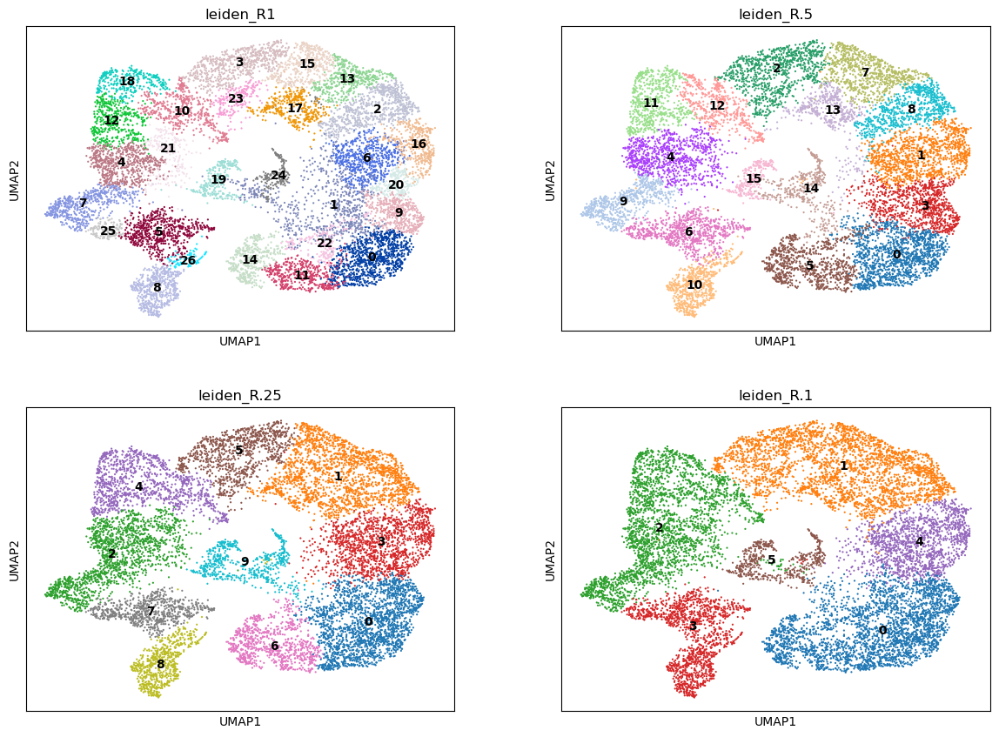

In [46]:
sc.plotting.umap(adata, color=['leiden_R1','leiden_R.5','leiden_R.25','leiden_R.1'], legend_loc='on data', ncols=2)

Comparing the Leiden clusters to the clusters represented by cell markers resolution 0,25 match the best

In [47]:
adata.layers

Layers with keys: raw_counts, spliced, unspliced, scaled_counts

In [48]:
adata

AnnData object with n_obs × n_vars = 11852 × 27335
    obs: 'DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets', 'n_counts', 'SpermatogoniaA_score', 'SpermatogoniaB_score', 'SpermatocytesI_score', 'SpermatocytesII_score', 'Round.Spt_score', 'Elong.Spt_score', 'Sertoli_score', 'Macroph_score', 'Leydig_score', 'Endothelial_score', 'Myoid_score', 'Pericyte_score', 'leiden_R1', 'leiden_R.5', 'leiden_R.25', 'leiden_R.1'
    var: 'gene_ids', 'feature_types', 'chromosome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'pca', 'log1p', 'hvg', 'DATASET_colors', 'neighbors', 'umap', 'leiden', 'leiden_R1_colors', 'leiden_R.5_colors', 'leiden_R.25_colors', 'leiden_R.1_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts', 'spliced', 'unspliced', 'scaled_counts'
    obsp: 'distances', 'connectivities'

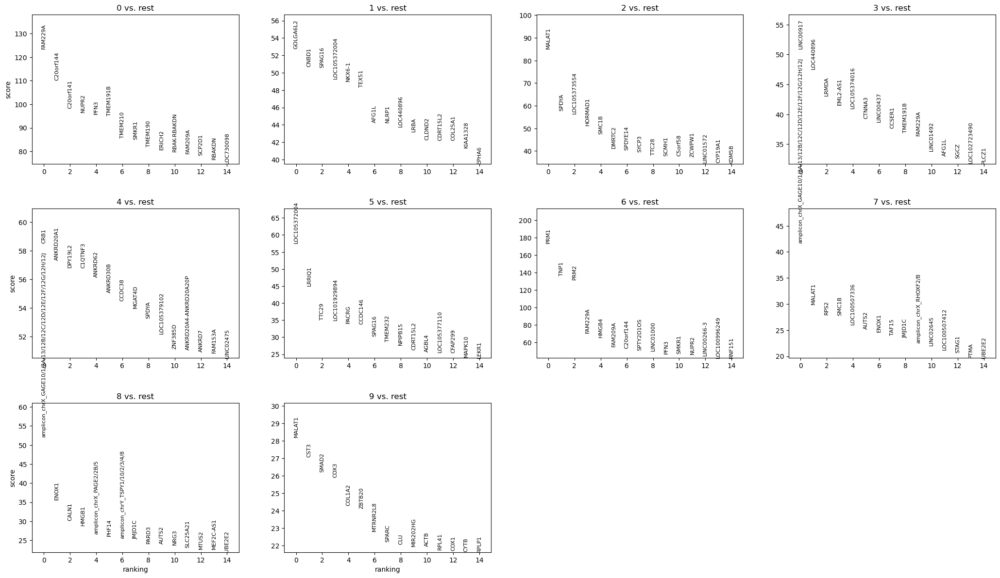

In [49]:
#Perform the test on logarithmized data (and not scaled) therefore starting with 'raw_counts' again
adata.X = adata.layers['raw_counts'] #raw data
sc.pp.normalize_per_cell(adata) #TPM normalization
sc.pp.log1p(adata) #logarithm
sc.tl.rank_genes_groups(adata, groupby='leiden_R.25', n_genes=50) #Top 50 diff.expressed genes in each cluster (t-test)
sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False)

In [50]:
adata.X = adata.layers['scaled_counts'] #Set again the scaled data as standard data matrix

In [51]:
adata

AnnData object with n_obs × n_vars = 11852 × 27335
    obs: 'DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets', 'n_counts', 'SpermatogoniaA_score', 'SpermatogoniaB_score', 'SpermatocytesI_score', 'SpermatocytesII_score', 'Round.Spt_score', 'Elong.Spt_score', 'Sertoli_score', 'Macroph_score', 'Leydig_score', 'Endothelial_score', 'Myoid_score', 'Pericyte_score', 'leiden_R1', 'leiden_R.5', 'leiden_R.25', 'leiden_R.1'
    var: 'gene_ids', 'feature_types', 'chromosome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'pca', 'log1p', 'hvg', 'DATASET_colors', 'neighbors', 'umap', 'leiden', 'leiden_R1_colors', 'leiden_R.5_colors', 'leiden_R.25_colors', 'leiden_R.1_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts', 'spliced', 'unspliced', 'scaled_counts'
    obsp: 'distances', 'connectivi

Organize result in a table. Each column has the cluster numbers with _N, _P, _L representing respectively the gene Names, their P-values and the Log-fold change of each gene expression compared to the other clusters.

In [1]:
result

NameError: name 'result' is not defined

In [52]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
X = pd.DataFrame(
    {group + '_' + key[:1].upper(): result[key][group]
    for group in groups for key in ['names', 'pvals_adj','logfoldchanges']})
X.head() #print only first five lines

,0_N,0_P,0_L,1_N,1_P,1_L,2_N,2_P,2_L,3_N,...,6_L,7_N,7_P,7_L,8_N,8_P,8_L,9_N,9_P,9_L
0,FAM229A,0.0,2.993674,GOLGA6L2,0.0,2.507439,MALAT1,0.000000e+00,2.634556,LINC00917,...,4.459568,amplicon_chrX_GAGE10/1/2A/13/12B/12C/12D/12E/1...,1.443090e-199,3.498356,amplicon_chrX_GAGE10/1/2A/13/12B/12C/12D/12E/1...,2.117194e-248,3.734297,MALAT1,1.080936e-112,1.769132
1,C20orf144,0.0,2.837014,CNBD1,0.0,2.769402,SPDYA,0.000000e+00,2.785405,LOC440896,...,4.492720,MALAT1,6.499916e-136,1.425540,ENOX1,1.246288e-174,1.061931,CST3,1.617720e-103,3.572648
2,C20orf141,0.0,3.194886,SPAG16,0.0,1.769469,LOC105373554,0.000000e+00,3.963899,LRMDA,...,3.227354,RPS2,1.059033e-117,2.936203,CALN1,3.547190e-129,2.252209,SMAD2,2.074890e-99,2.748303
3,NUPR2,0.0,2.395844,LOC105372004,0.0,2.544004,HORMAD1,0.000000e+00,2.577044,EML2-AS1,...,2.512029,SMC1B,1.094405e-117,2.307861,HMGB1,7.001530e-122,2.140508,COX3,1.389586e-97,3.063162
4,PFN3,0.0,2.771410,NKX6-1,0.0,3.499642,SMC1B,1.509820e-318,2.568479,LOC105374016,...,2.798162,LOC100507336,4.686908e-105,4.606286,amplicon_chrX_PAGE2/2B/5,1.263662e-107,2.403264,COL1A2,1.448147e-88,5.846496


In [53]:
adata

AnnData object with n_obs × n_vars = 11852 × 27335
    obs: 'DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets', 'n_counts', 'SpermatogoniaA_score', 'SpermatogoniaB_score', 'SpermatocytesI_score', 'SpermatocytesII_score', 'Round.Spt_score', 'Elong.Spt_score', 'Sertoli_score', 'Macroph_score', 'Leydig_score', 'Endothelial_score', 'Myoid_score', 'Pericyte_score', 'leiden_R1', 'leiden_R.5', 'leiden_R.25', 'leiden_R.1'
    var: 'gene_ids', 'feature_types', 'chromosome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'pca', 'log1p', 'hvg', 'DATASET_colors', 'neighbors', 'umap', 'leiden', 'leiden_R1_colors', 'leiden_R.5_colors', 'leiden_R.25_colors', 'leiden_R.1_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts', 'spliced', 'unspliced', 'scaled_counts'
    obsp: 'distances', 'connectivi

In [111]:
X[ ['3_N'] ]


,3_N
0,LINC00917
1,LOC440896
2,LRMDA
3,EML2-AS1
4,LOC105374016
5,CTNNA3
6,LINC00437
7,CCSER1
8,TMEM191B
9,FAM229A


In [54]:
adata

AnnData object with n_obs × n_vars = 11852 × 27335
    obs: 'DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets', 'n_counts', 'SpermatogoniaA_score', 'SpermatogoniaB_score', 'SpermatocytesI_score', 'SpermatocytesII_score', 'Round.Spt_score', 'Elong.Spt_score', 'Sertoli_score', 'Macroph_score', 'Leydig_score', 'Endothelial_score', 'Myoid_score', 'Pericyte_score', 'leiden_R1', 'leiden_R.5', 'leiden_R.25', 'leiden_R.1'
    var: 'gene_ids', 'feature_types', 'chromosome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'pca', 'log1p', 'hvg', 'DATASET_colors', 'neighbors', 'umap', 'leiden', 'leiden_R1_colors', 'leiden_R.5_colors', 'leiden_R.25_colors', 'leiden_R.1_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts', 'spliced', 'unspliced', 'scaled_counts'
    obsp: 'distances', 'connectivi

In [55]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head() # top 5 ranked genes for each cluster

,0,1,2,3,4,5,6,7,8,9
0,FAM229A,GOLGA6L2,MALAT1,LINC00917,CRB1,LOC105372004,PRM1,amplicon_chrX_GAGE10/1/2A/13/12B/12C/12D/12E/1...,amplicon_chrX_GAGE10/1/2A/13/12B/12C/12D/12E/1...,MALAT1
1,C20orf144,CNBD1,SPDYA,LOC440896,ANKRD20A1,LRRIQ1,TNP1,MALAT1,ENOX1,CST3
2,C20orf141,SPAG16,LOC105373554,LRMDA,DPY19L2,TTC29,PRM2,RPS2,CALN1,SMAD2
3,NUPR2,LOC105372004,HORMAD1,EML2-AS1,C1QTNF3,LOC101929894,FAM229A,SMC1B,HMGB1,COX3
4,PFN3,NKX6-1,SMC1B,LOC105374016,ANKRD62,PACRG,HMGB4,LOC100507336,amplicon_chrX_PAGE2/2B/5,COL1A2


In [56]:
cd /home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/results

/faststorage/project/testis_singlecell/Workspaces/adahl/birc-project-akd/results


In [115]:
!mkdir -p cluster_results/BON

In [116]:
X.to_csv('cluster_results/BON/expr_annotation.csv', sep=',', index=None)

In [57]:
# cell type names for the chosen clusters

#new_names = {
#    '0':'SpermatogoniaA.1',
#    '1':'SpermatogoniaA.2',
#    '2':'Myoid',
#    '3':'Endothelial',
#    '4':'Leydig',
#    '5':'SpermatogoniaB',
#    '6':'Elong_Spermatids',
#    '7':'SpermatocitesII.1',
#    '8':'SpermatocitesII.2',
#    '9':'Round_Spermatids',
#    '10':'SpermatocitesI',
#    '11':'Macroph',
#    '12':'Pericytes'}


new_names = {
    '0':'Elong_Spermatids',
    '1':'Round_Spermatids',
    '2':'SpermatocytesI',
    '3':'Round_Spermatids',
    '4':'SpermatocytesII',
    '6':'Elong_Spermatids',
    '7':'SpermatogoniaB',
    '8':'SpermatogoniaA',
    '9':'Pericytes',
}

We merge the clusters with same names. This cannot be done with a categorical object, where categories cannot have the same name. We convert the cluster names into a simple array to do this, and then reconvert it to a categorical object.

In [118]:
adata.obs['spermatogenesis_types'] = rename_clusters(new_names, adata.obs['leiden_R.25']) #give clusters a cell type

ValueError: Categorical categories must be unique

In [119]:
adata.obs['spermatogenesis_types']

SN219_AAACCTGAGAAAGTGG      SpermatocytesI
SN219_AAACCTGAGACCTTTG      SpermatocytesI
SN219_AAACCTGAGATCCCAT    Elong_Spermatids
SN219_AAACCTGAGCGGCTTC    Round_Spermatids
SN219_AAACCTGAGGCGCTCT      SpermatogoniaB
                                ...       
SN224_TTTGTCACATCCTTGC      SpermatocytesI
SN224_TTTGTCAGTCTAGAGG    Round_Spermatids
SN224_TTTGTCAGTGAGTGAC    Elong_Spermatids
SN224_TTTGTCATCCGCAGTG      SpermatogoniaA
SN224_TTTGTCATCGGAATCT      SpermatocytesI
Name: spermatogenesis_types, Length: 11852, dtype: category
Categories (8, object): ['5', 'Elong_Spermatids', 'Pericytes', 'Round_Spermatids', 'SpermatocytesI', 'SpermatocytesII', 'SpermatogoniaA', 'SpermatogoniaB']

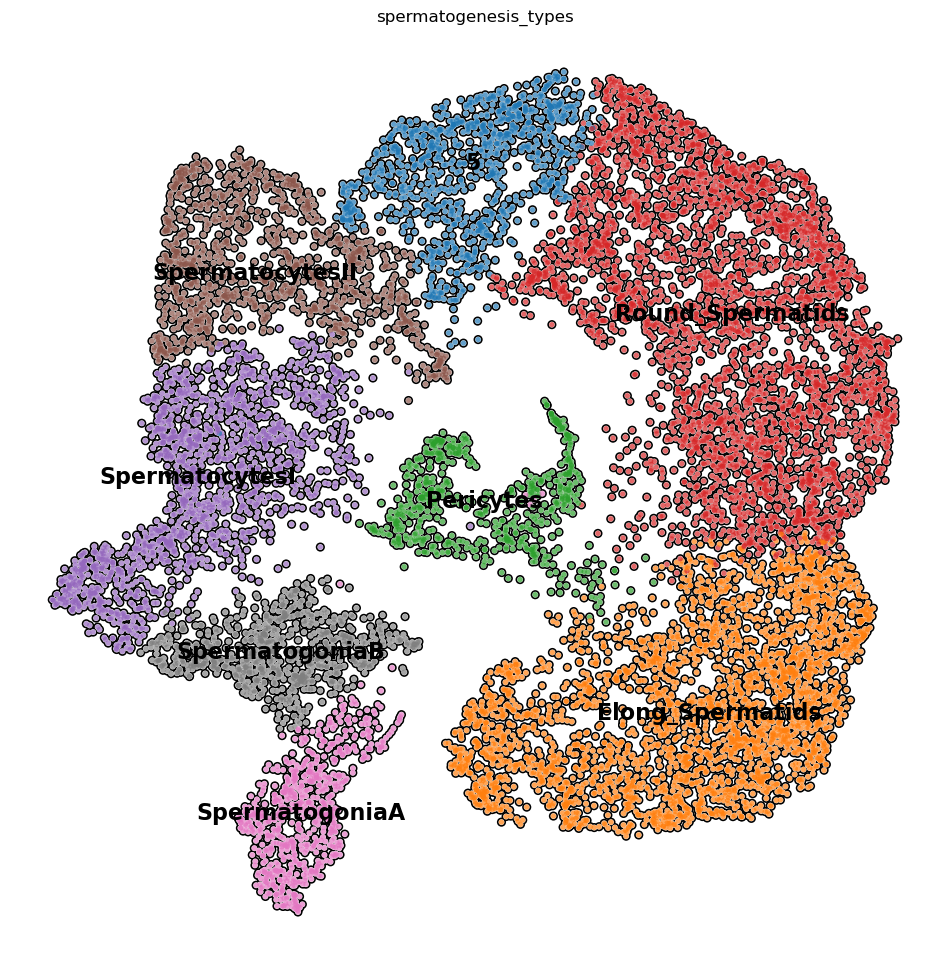

In [120]:
plt.rcParams['figure.figsize'] = (12,12)
sc.pl.umap( adata, color=['spermatogenesis_types'], 
           legend_loc='on data', 
           legend_fontsize=16,
           frameon=False,
           size=60,
           add_outline=True,
           ncols=1  
           )

In [121]:
path_out = f'/home/astridkd/testis_singlecell/Workspaces/adahl/birc-project-akd/results/cluster_results/BON'

if not os.path.exists(path_out):
    os.makedirs(path_out)

adata_out = f'{path_out}/cluster_adata.h5ad'

In [122]:
pwd

'/faststorage/project/testis_singlecell/Workspaces/adahl/birc-project-akd/results'

In [123]:
adata.write(adata_out)

In [58]:
adata

AnnData object with n_obs × n_vars = 11852 × 27335
    obs: 'DATASET', 'batch', 'total_counts', 'n_genes_by_counts', 'percent_mito', 'prop_unspl', 'prop_spl', 'perc_MALAT1', 'n_genes', 'doublet_scores', 'predicted_doublets', 'n_counts', 'SpermatogoniaA_score', 'SpermatogoniaB_score', 'SpermatocytesI_score', 'SpermatocytesII_score', 'Round.Spt_score', 'Elong.Spt_score', 'Sertoli_score', 'Macroph_score', 'Leydig_score', 'Endothelial_score', 'Myoid_score', 'Pericyte_score', 'leiden_R1', 'leiden_R.5', 'leiden_R.25', 'leiden_R.1'
    var: 'gene_ids', 'feature_types', 'chromosome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'pca', 'log1p', 'hvg', 'DATASET_colors', 'neighbors', 'umap', 'leiden', 'leiden_R1_colors', 'leiden_R.5_colors', 'leiden_R.25_colors', 'leiden_R.1_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts', 'spliced', 'unspliced', 'scaled_counts'
    obsp: 'distances', 'connectivi